# Liga Portugal Crosses


This Notebook is inspired by the work done by @sonofacorner in https://github.com/sonofacorner/soc-viz-of-the-week/blob/main/01022023/01022023.ipynb. I applied his notebook to study Frequency, Accuracy and Posiion of Crosses performed across all teams in the Liga Portugal, season 24/25 (updated as of 11th of April).

You can refer to the original post if needed, as some changes wre made througout this work, namely data collection and processing phase.

## Imports and Fonts


In [1]:
import json
import math
import os
import urllib
import urllib.request
from ast import literal_eval

import matplotlib.font_manager as fm
import matplotlib.patches as mpatches
import matplotlib.patheffects as path_effects
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
from highlight_text import ax_text, fig_text
from matplotlib import cm
from matplotlib.patches import RegularPolygon
from mplsoccer import Pitch, VerticalPitch, lines
from PIL import Image

## Some settings

In [2]:
font_path = r"C:\Users\Vitor\Desktop\Football Data Analytics\My_Projects\soc-viz-of-the-week-main\assets\fonts"  # Change path as needed
for x in os.listdir(font_path):
    for y in os.listdir(f"{font_path}/{x}"):
        if (y.split(".")[-1] == "ttf") or (y.split(".")[-1] == "otf"):
            fm.fontManager.addfont(f"{font_path}/{x}/{y}")
            try:
                fm.FontProperties(
                    weight=y.split("-")[-1].split(".")[0].lower(), fname=y.split("-")[0]
                )
            except Exception:
                continue

plt.style.use(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\My_Projects\soc-viz-of-the-week-main\assets\stylesheets\soc_base.mplstyle"  # Change path as needed
)
plt.rcParams["font.family"] = "DM Sans"

## Reading and cleaning the data


In [3]:
# Load from Parquet. This Event data has been scraped using a different notebook, available in a different folder
events_pt_2425 = pd.read_parquet(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\My_Projects\Main level\data\Event_data_PRT-Liga_Portugal_2024.parquet"  # Change path as needed
)

# Convert JSON strings back to Python objects
events_pt_2425["qualifiers"] = events_pt_2425["qualifiers"].apply(json.loads)
events_pt_2425["satisfied_events_types"] = events_pt_2425[
    "satisfied_events_types"
].apply(json.loads)

print(type(events_pt_2425["satisfied_events_types"].iloc[0]))
print(type(events_pt_2425["qualifiers"].iloc[0]))

# Load a support file that contains team names, team ids (from mutliple sources) and team color codes
## This document was created using a notebook also available in the Analysis Tools folder
team_map = pd.read_csv(
    r"C:\Users\Vitor\Desktop\Football Data Analytics\My_Projects\Analysis Tools\team_mapping_and_colors.csv",  # Change path as needed
    encoding="utf-8",
)

<class 'list'>
<class 'list'>


In [4]:
data_crosses = events_pt_2425.copy()
data_crosses["is_cross"] = False
data_crosses["is_assist"] = False
for index, row in enumerate(data_crosses["satisfied_events_types"]):
    if ("passCrossInaccurate" in row or "passCrossAccurate" in row) and (
        "passCorner" not in row
    ):
        data_crosses.at[index, "is_cross"] = True
        if "assist" in row:
            data_crosses.at[index, "is_assist"] = True

In [5]:
data_crosses = data_crosses[data_crosses["is_cross"]].reset_index(drop=True)
data_crosses = pd.merge(
    data_crosses, team_map[["team_id", "fotmob_team_id"]], how="left", on="team_id"
)
data_crosses

,league,season,game,game_id,period,minute,second,expanded_minute,type,outcome_type,...,satisfied_events_types,is_touch,is_shot,is_goal,card_type,related_event_id,related_player_id,is_cross,is_assist,fotmob_team_id
0,PRT-Liga Portugal,2425,2024-08-09 Sporting CP-Rio Ave,1836567,FirstHalf,2,33.0,2,Pass,Unsuccessful,...,"[touches, passLeftFoot, passChipped, passCross...",True,None,None,None,NaN,NaN,True,False,9768
1,PRT-Liga Portugal,2425,2024-08-09 Sporting CP-Rio Ave,1836567,FirstHalf,13,20.0,13,Pass,Unsuccessful,...,"[touches, passRightFoot, passChipped, passCros...",True,None,None,None,NaN,NaN,True,False,9768
2,PRT-Liga Portugal,2425,2024-08-09 Sporting CP-Rio Ave,1836567,FirstHalf,18,31.0,18,Pass,Unsuccessful,...,"[touches, passRightFoot, passChipped, passCros...",True,None,None,None,NaN,NaN,True,False,9768
3,PRT-Liga Portugal,2425,2024-08-09 Sporting CP-Rio Ave,1836567,FirstHalf,19,26.0,19,Pass,Unsuccessful,...,"[touches, passRightFoot, passChipped, passCros...",True,None,None,None,NaN,NaN,True,False,7841
4,PRT-Liga Portugal,2425,2024-08-09 Sporting CP-Rio Ave,1836567,FirstHalf,27,41.0,27,Pass,Unsuccessful,...,"[touches, passRightFoot, passChipped, passCros...",True,None,None,None,NaN,NaN,True,False,7841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6812,PRT-Liga Portugal,2425,2025-04-12 Santa Clara-Sporting CP,1836751,SecondHalf,87,12.0,90,Pass,Successful,...,"[touches, passForwardZoneAccurate, passChipped...",True,None,None,None,NaN,NaN,True,False,9768
6813,PRT-Liga Portugal,2425,2025-04-12 Santa Clara-Sporting CP,1836751,SecondHalf,88,12.0,91,Pass,Unsuccessful,...,"[touches, passChipped, passCrossInaccurate, pa...",True,None,None,None,NaN,NaN,True,False,9768
6814,PRT-Liga Portugal,2425,2025-04-12 Santa Clara-Sporting CP,1836751,SecondHalf,88,28.0,91,Pass,Successful,...,"[touches, passForwardZoneAccurate, passKey, pa...",True,None,None,None,NaN,NaN,True,False,1567
6815,PRT-Liga Portugal,2425,2025-04-12 Santa Clara-Sporting CP,1836751,SecondHalf,89,24.0,92,Pass,Successful,...,"[touches, passForwardZoneAccurate, passChipped...",True,None,None,None,NaN,NaN,True,False,1567


In [6]:
order_teams = (
    data_crosses.groupby(["team", "fotmob_team_id"])["is_cross"]
    .sum()
    .reset_index()
    .sort_values(by="is_cross", ascending=False)
    .reset_index(drop=True)
)
order_teams

,team,fotmob_team_id,is_cross
0,Vitoria de Guimaraes,7844,526
1,Braga,10264,463
2,FC Porto,9773,455
3,Benfica,9772,442
4,Famalicao,1634,419
5,Farense,6004,404
6,Sporting CP,9768,399
7,Boavista,8613,390
8,Arouca,158085,384
9,Nacional,10214,383


Here we create a function that goes over most of the process of plotting the crosses viz.

In [7]:
def plot_crosses_by_team(ax, team, logo_url=None, show_logo=True):
    plot_df = data_crosses[(data_crosses["team"] == team)]

    pitch = VerticalPitch(
        pitch_type="opta",
        goal_type="box",
        linewidth=0.85,
        line_color="black",
        half=True,
    )
    pitch.draw(ax=ax)

    # Split successful corners from unsuccessful attempts
    assists = plot_df[plot_df["is_assist"] == True]
    others = plot_df[plot_df["is_assist"] != True]
    other_s = plot_df[plot_df["outcome_type"] == "Successful"]
    other_u = plot_df[plot_df["outcome_type"] != "Successful"]

    lines(
        other_s.y,
        other_s.x,
        other_s.end_y,
        other_s.end_x,
        ax=ax,
        comet=True,
        alpha_start=0.04,
        alpha_end=0.08,
        lw=0.3,
        transparent=True,
        color="#307351",
    )
    lines(
        other_u.y,
        other_u.x,
        other_u.end_y,
        other_u.end_x,
        ax=ax,
        comet=True,
        alpha_start=0.04,
        alpha_end=0.08,
        lw=0.3,
        transparent=True,
        color="#70163C",
    )

    for _, a in assists.iterrows():
        pass_arrow = mpatches.FancyArrowPatch(
            (a.y, a.x),
            (a.end_y, a.end_x),
            ec="#307351",
            fc="#efe9e6",
            arrowstyle="-|>,head_length=5.6,head_width=2.2",
            zorder=4,
        )
        ax.add_patch(pass_arrow)

    ax.scatter(
        assists["y"],
        assists["x"],
        marker="o",
        fc=ax.get_facecolor(),
        ec="#307351",
        zorder=4,
    )
    ax.scatter(
        other_s["y"],
        other_s["x"],
        marker="o",
        fc=ax.get_facecolor(),
        ec="#307351",
        zorder=3,
        alpha=0.65,
        s=5,
        lw=0.2,
    )
    ax.scatter(
        other_u["y"],
        other_u["x"],
        marker="o",
        fc=ax.get_facecolor(),
        ec="#70163C",
        zorder=3,
        alpha=0.65,
        s=5,
        lw=0.2,
    )

    # Left vs right side split
    left_side = plot_df[plot_df["y"] > 50].shape[0]
    right_side = plot_df[plot_df["y"] < 50].shape[0]
    left_success = other_s[other_s["y"] > 50].shape[0]
    right_success = other_s[other_s["y"] < 50].shape[0]

    if right_side > left_side:
        color_left = "#e7deda"
        color_right = "#d7c8c1"
    else:
        color_right = "#e7deda"
        color_left = "#d7c8c1"

    ax.fill_between(
        x=[0.35, 50], y1=ax.get_ylim()[0], y2=99.65, color=color_right, zorder=-1
    )
    ax.fill_between(
        x=[99.35, 50], y1=ax.get_ylim()[0], y2=99.65, color=color_left, zorder=-1
    )

    # Side annotations
    ax_text(
        x=97,
        y=55,
        s=f"Crosses: {left_side:.0f}\n<Success (%): {left_success / left_side:.1%}>",
        ha="left",
        va="center",
        weight="bold",
        textalign="top",
        highlight_textprops=[{"color": "#307351"}],
        size=8,
        ax=ax,
        color="black",
    )
    ax_text(
        x=3,
        y=55,
        s=f"Crosses: {right_side:.0f}\n<Success (%): {right_success / right_side:.1%}>",
        ha="right",
        va="center",
        weight="bold",
        textalign="top",
        highlight_textprops=[{"color": "#307351"}],
        size=8,
        ax=ax,
        color="black",
    )

    # Team name
    ax.annotate(
        xy=(55, 110),
        text=plot_df["team"].iloc[0].upper(),
        size=15,
        color="black",
        ha="center",
        va="top",
        weight="bold",
        annotation_clip=False,
    )

    # Add club logo
    if show_logo and logo_url is not None:
        try:
            club_icon = Image.open(urllib.request.urlopen(logo_url))
            image_ax = ax.inset_axes(
                [0.80, 1.01, 0.2, 0.2],  # [x, y, width, height]
                transform=ax.transAxes,
            )
            image_ax.imshow(club_icon)
            image_ax.axis("off")
        except Exception as e:
            print(f"Logo failed for {team}: {e}")

    return ax


Now we continue by adjusting some more details.

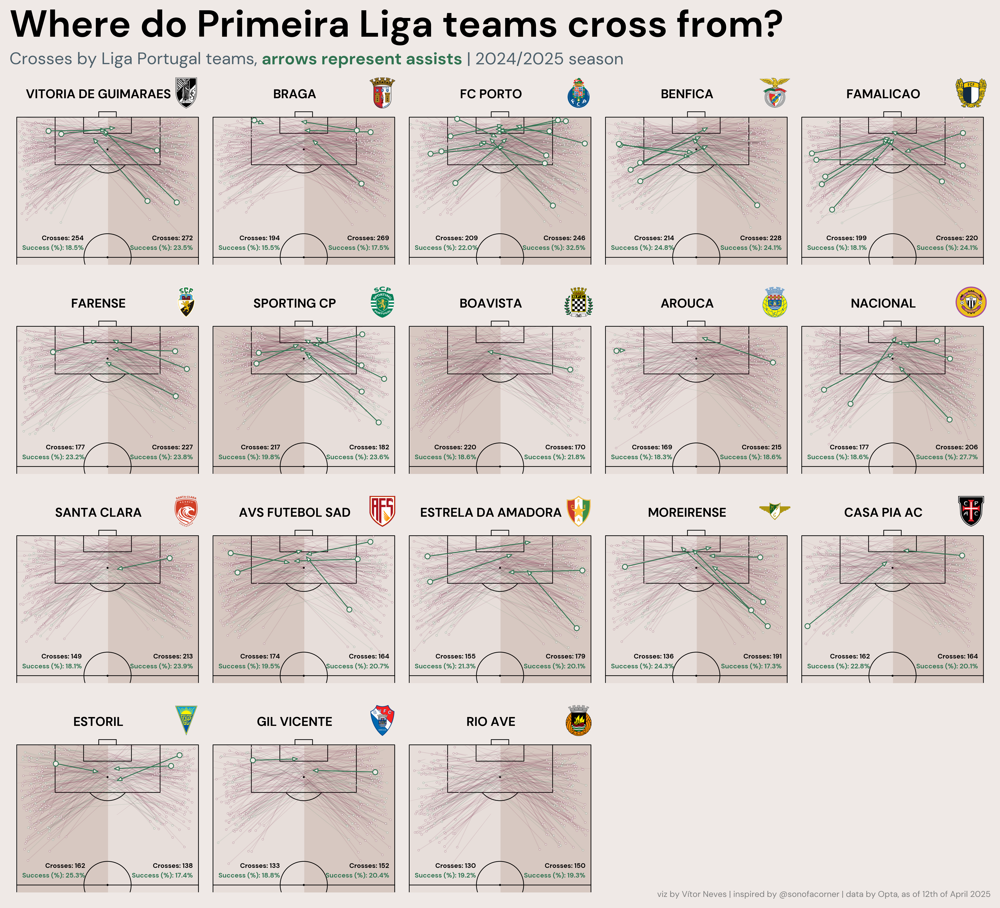

In [8]:
# === Configuration ===
fotmob_url = "https://images.fotmob.com/image_resources/logo/teamlogo/"
save_dir = r"C:\Users\Vitor\Desktop\Football Data Analytics\My_Projects\02_Primeira_Liga_Crosses\media"
os.makedirs(save_dir, exist_ok=True)

# === Grid Setup ===
n_teams = len(order_teams)
n_cols = 5
n_rows = math.ceil(n_teams / n_cols)

fig, axs = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(18, 18), dpi=300)
axs = np.array(axs).reshape(-1)

# === Plotting Crosses Per Team ===
for index, ax in enumerate(axs):
    if index < n_teams:
        team_name = order_teams["team"].iloc[index]
        team_id = order_teams["fotmob_team_id"].iloc[index]
        logo_link = f"{fotmob_url}{int(team_id)}.png"
        plot_crosses_by_team(ax, team_name, logo_url=logo_link, show_logo=True)
    else:
        ax.axis("off")  # Hide unused subplot

plt.subplots_adjust(wspace=0, hspace=0.25, top=0.78, bottom=0.05, left=0.05, right=0.95)

# === Titles and Annotations ===
fig_text(
    x=0.05,
    y=0.85,
    s="Where do Primeira Liga teams cross from?",
    va="center",
    ha="left",
    fontsize=45,
    color="black",
    font="DM Sans",
    weight="bold",
)
fig_text(
    x=0.05,
    y=0.82,
    s="Crosses by Liga Portugal teams, <arrows represent assists> | 2024/2025 season",
    highlight_textprops=[{"weight": "bold", "color": "#307351"}],
    va="center",
    ha="left",
    fontsize=20,
    color="#4E616C",
    font="DM Sans",
)
fig_text(
    x=0.95,
    y=0.05,
    s="viz by Vítor Neves | inspired by @sonofacorner | data by Opta, as of 12th of April 2025",
    va="bottom",
    ha="right",
    fontsize=10,
    color="grey",
    font="DM Sans",
)

# === Save Visuals ===
save_path_bg = os.path.join(save_dir, "12042025_liga_portugal_2425_cruzamentos.png")
save_path_tr = os.path.join(save_dir, "12042025_liga_portugal_2425_cruzamentos_tr.png")

plt.savefig(
    save_path_bg,
    dpi=300,
    facecolor="#EFE9E6",
    bbox_inches="tight",
    edgecolor="none",
    transparent=False,
)
plt.savefig(
    save_path_tr,
    dpi=300,
    facecolor="none",
    bbox_inches="tight",
    edgecolor="none",
    transparent=True,
)
